In [1]:
!pip3 install tensorflow

In [109]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import seaborn as sns
import random
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
import joblib
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from sklearn.metrics import roc_curve, auc

In [3]:
datagen = ImageDataGenerator(
    rotation_range=180,
    fill_mode='nearest',
    horizontal_flip=True,
    vertical_flip=True,
    brightness_range=[0.4,0.9],

)

In [120]:
images = []
labels = []
name_of_label = os.listdir("/content/drive/MyDrive/SHUVO SIR SNAKES/snakes_dataset")
for co,i in enumerate(name_of_label):
    for j in os.listdir(f"/content/drive/MyDrive/SHUVO SIR SNAKES/snakes_dataset/{i}"):
        print(f"/content/drive/MyDrive/SHUVO SIR SNAKES/snakes_dataset/{i}/{j}")
        loard_image = img_to_array(load_img(f"/content/drive/MyDrive/SHUVO SIR SNAKES/snakes_dataset/{i}/{j}", target_size=(224, 224)))

        #images.append(loard_image)
        #labels.append(co)
        # image Gen
        aug_iter = datagen.flow(np.expand_dims(loard_image, axis=0), batch_size=1)
        for h in range(6):
            image = next(aug_iter)[0].astype('uint8')
            images.append(image)
            labels.append(co)

images = np.array(images)
labels = np.array(labels)

/content/drive/MyDrive/SHUVO SIR SNAKES/snakes_dataset/natrix_images/image_517.jpg
/content/drive/MyDrive/SHUVO SIR SNAKES/snakes_dataset/natrix_images/image_489.jpg
/content/drive/MyDrive/SHUVO SIR SNAKES/snakes_dataset/natrix_images/image_465.jpg
/content/drive/MyDrive/SHUVO SIR SNAKES/snakes_dataset/natrix_images/image_516.jpg
/content/drive/MyDrive/SHUVO SIR SNAKES/snakes_dataset/natrix_images/image_521.jpg
/content/drive/MyDrive/SHUVO SIR SNAKES/snakes_dataset/natrix_images/image_460.jpg
/content/drive/MyDrive/SHUVO SIR SNAKES/snakes_dataset/natrix_images/image_530.jpg
/content/drive/MyDrive/SHUVO SIR SNAKES/snakes_dataset/natrix_images/image_479.jpg
/content/drive/MyDrive/SHUVO SIR SNAKES/snakes_dataset/natrix_images/image_476.jpg
/content/drive/MyDrive/SHUVO SIR SNAKES/snakes_dataset/natrix_images/image_464.jpg
/content/drive/MyDrive/SHUVO SIR SNAKES/snakes_dataset/natrix_images/image_488.jpg
/content/drive/MyDrive/SHUVO SIR SNAKES/snakes_dataset/natrix_images/image_468.jpg
/con

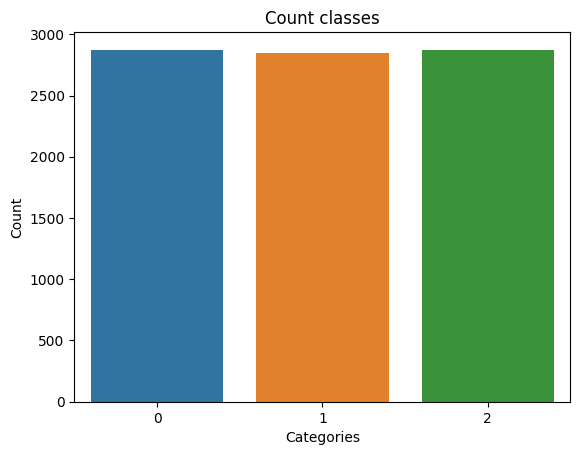

In [121]:
# Create a countplot
sns.countplot(x=labels)

# Add labels and a title
plt.xlabel("Categories")
plt.ylabel("Count")
plt.title("Count classes")

# Show the plot
plt.show()

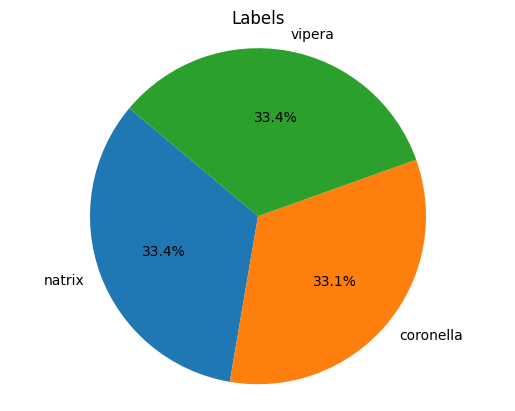

In [134]:
import numpy as np


unique_values, counts = np.unique(labels, return_counts=True)

# Create a dictionary from unique values and counts
data = dict(zip(unique_values, counts))

labels_ = [i.split("_")[0] for i in name_of_label]
sizes_ = list(data.values())

# Create a pie chart
plt.pie(sizes_, labels=labels_, autopct='%1.1f%%', startangle=140)

# Add a title
plt.title('Labels')

# Display the pie chart
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

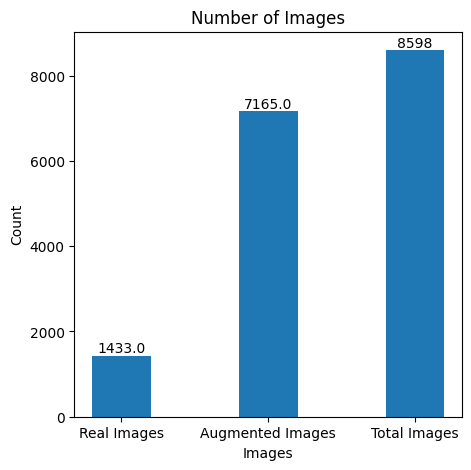

In [122]:
# creating the dataset
data = {'Real Images':labels.shape[0]/6, 'Augmented Images':labels.shape[0] - labels.shape[0]/6, "Total Images": labels.shape[0]}
courses = list(data.keys())
values = list(data.values())

fig = plt.figure(figsize = (5, 5))

# creating the bar plot
plt.bar(courses, values, #color ='maroon',
		width = 0.4)
for j, v in enumerate(values):
        plt.text(j, v + 2, f'{v}', ha='center', va='bottom')

plt.xlabel("Images")
plt.ylabel("Count")
plt.title("Number of Images")
plt.show()


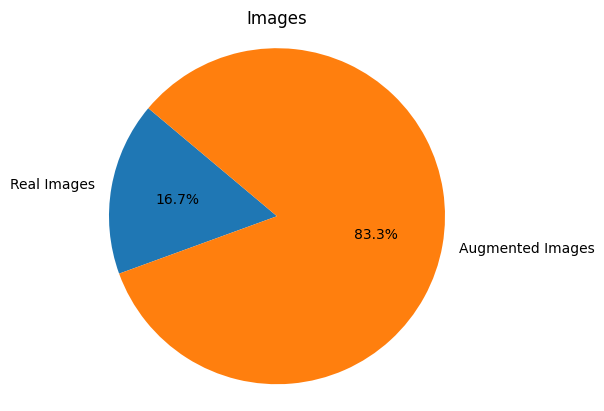

In [125]:
import matplotlib.pyplot as plt
data = {'Real Images':labels.shape[0]/6, 'Augmented Images':labels.shape[0] - labels.shape[0]/6}
labels_ = list(data.keys())
sizes_ = list(data.values())

# Create a pie chart
plt.pie(sizes_, labels=labels_, autopct='%1.1f%%', startangle=140)

# Add a title
plt.title('Images')

# Display the pie chart
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()


In [7]:
images.shape

(8598, 224, 224, 3)

In [8]:
image.shape

(224, 224, 3)

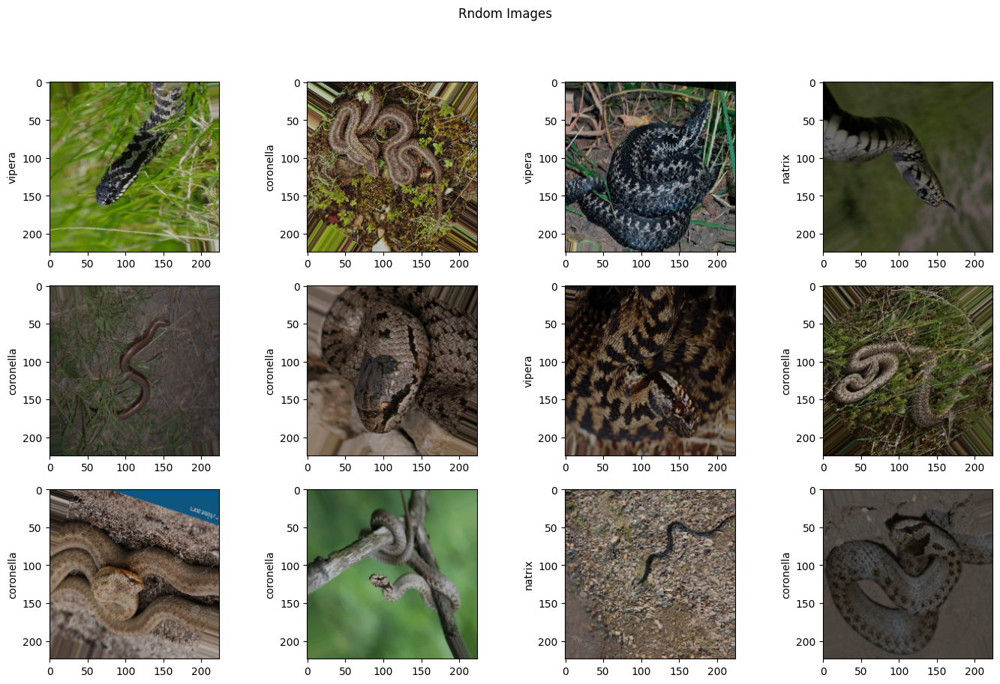

In [9]:
plt.figure(figsize=(17,10))

for i,random_number in enumerate(random.sample(range(2200, 8500,200), 12)):
    plt.subplot(3,4,i+1)
    plt.imshow(images[random_number])
    plt.ylabel(name_of_label[labels[random_number]].split("_")[0])
plt.suptitle("Rndom Images")
plt.show()

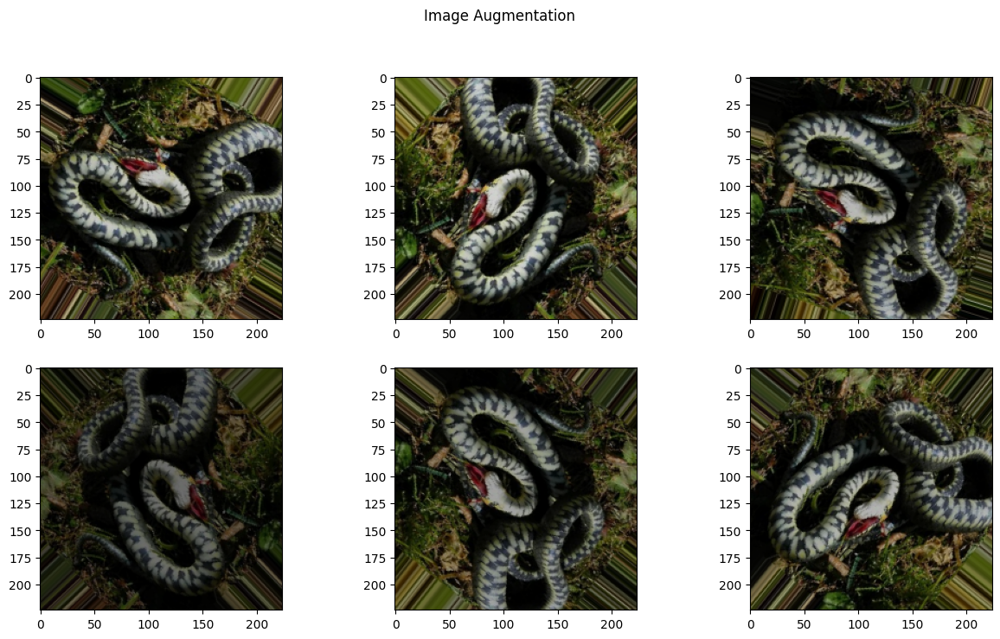

In [10]:
plt.figure(figsize=(15,8))

for i in range(6,12):
    plt.subplot(2,3,i+1-6)
    plt.imshow(images[i])
plt.suptitle("Image Augmentation")
plt.show()

In [11]:
x_train,x_test,y_train,y_test = train_test_split(images,labels,test_size=0.16,random_state=42)

**MODEL 1 CNN**

In [12]:
model = Sequential()

model.add(layers.Rescaling(1.0 / 255.0, input_shape=(224, 224, 3)))

# Convolutional layers
model.add(layers.Conv2D(16, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for the fully connected layers
model.add(layers.Flatten())

# Fully connected layers
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(64, activation='relu'))

# Output layer with 3 classes and softmax activation
model.add(layers.Dense(3, activation='softmax'))

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',  # Use categorical cross-entropy for multi-class classification
              metrics=['accuracy'])

# Display model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 222, 222, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 16)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 64)        1

In [13]:
#history = model.fit(x_train, to_categorical(y_train), epochs=50, batch_size=64, validation_data=(x_test, to_categorical(y_test)))

In [14]:
#model.save('/content/drive/MyDrive/SHUVO SIR SNAKES/CNN.h5')
#joblib.dump(history, '/content/drive/MyDrive/SHUVO SIR SNAKES/CNN_history.pkl')

In [60]:
model = tf.keras.models.load_model('/content/drive/MyDrive/SHUVO SIR SNAKES/CNN.h5')
history = joblib.load('/content/drive/MyDrive/SHUVO SIR SNAKES/CNN_history.pkl')

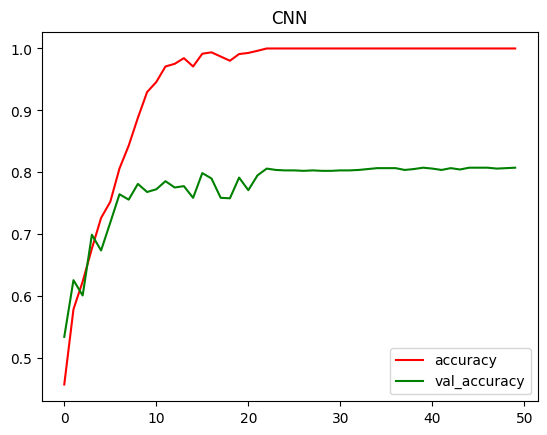

In [62]:
plt.plot([i for i in range(len(history.history['accuracy']))], history.history['accuracy'], color='red',label=f'accuracy')
plt.plot([i for i in range(len(history.history['val_accuracy']))], history.history['val_accuracy'], color='green',label=f'val_accuracy')
plt.title("CNN")
plt.legend()
plt.show()

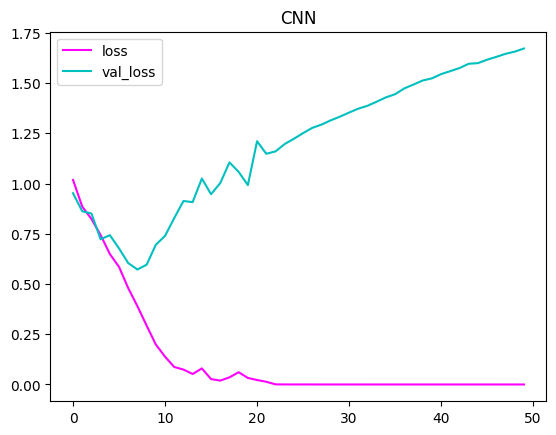

In [63]:
plt.plot([i for i in range(len(history.history['loss']))], history.history['loss'], color='magenta',label=f'loss')
plt.plot([i for i in range(len(history.history['val_loss']))], history.history['val_loss'], color='c',label=f'val_loss')
plt.title("CNN")
plt.legend()
plt.show()

1/1 [==============================] - 0s 29ms/step


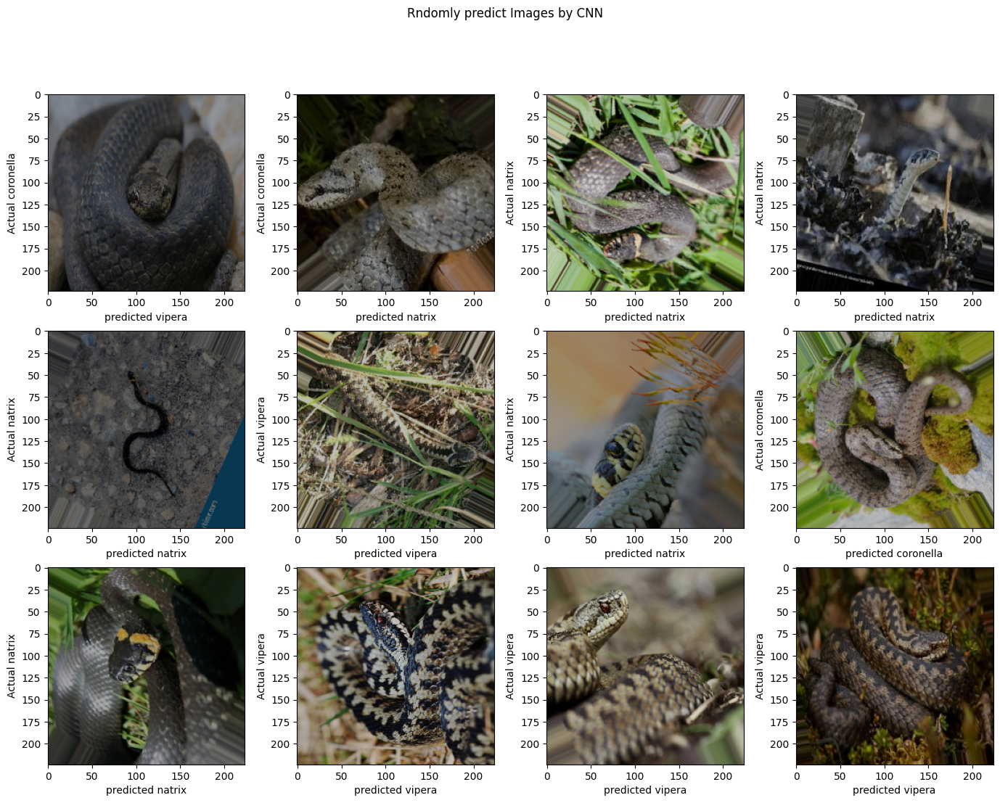

In [64]:
plt.figure(figsize=(17,12))

for i,random_number in enumerate(random.sample(range(0, 600), 12)):
    plt.subplot(3,4,i+1)
    plt.imshow(x_test[random_number])

    normalized_image = np.expand_dims(x_test[random_number], axis=0)
    predictions = model.predict(normalized_image)

    plt.ylabel(f'Actual {name_of_label[y_test[random_number]].split("_")[0]}')
    plt.xlabel(f'predicted {name_of_label[np.argmax(predictions)].split("_")[0]}')

plt.suptitle("Rndomly predict Images by CNN")
plt.show()

In [65]:
y_pre_0 = []
for i in model.predict(x_test):
    y_pre_0.append(np.argmax(i))
y_pre_0 = np.array(y_pre_0)

43/43 [==============================] - 0s 9ms/step


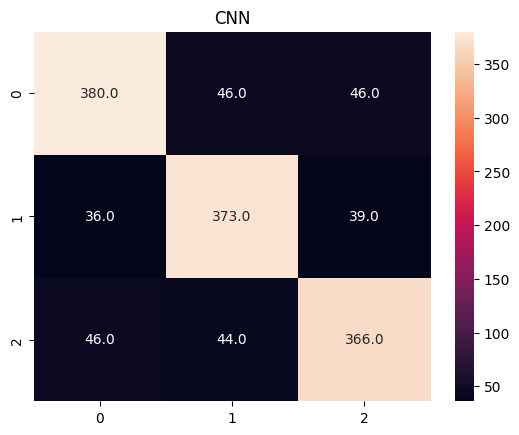

In [66]:
sns.heatmap(confusion_matrix(y_test, y_pre_0),annot=True,fmt=".1f")
plt.title("CNN")
plt.show()

In [68]:
accuracy = accuracy_score(y_test, y_pre_0)

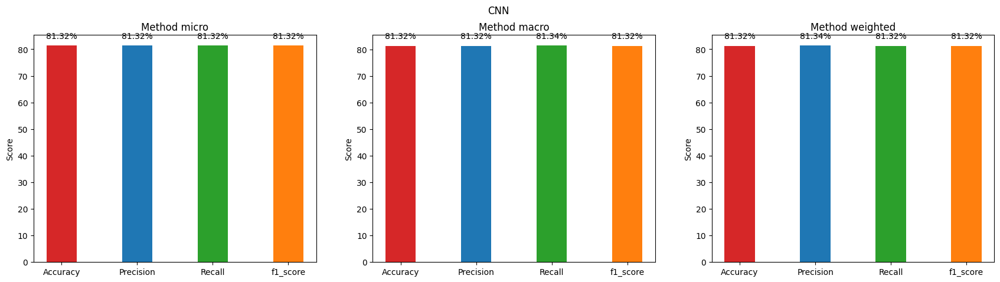

In [69]:
type_ = ['micro','macro','weighted']
plt.figure(figsize=(21,5))
for i in range(3):
    plt.subplot(1,3,i+1)
    data = {"Accuracy": accuracy_score(y_test, y_pre_0)*100,
        'Precision': precision_score(y_test, y_pre_0, average=type_[i])*100,
            'Recall':recall_score(y_test, y_pre_0, average=type_[i])*100,
            "f1_score": f1_score(y_test, y_pre_0, average=type_[i])*100}
    courses = list(data.keys())
    values = list(data.values())
    bar_colors = ['tab:red', 'tab:blue', 'tab:green', 'tab:orange']
    plt.bar(courses, values, color=bar_colors,
            width = 0.4)
    for j, v in enumerate(values):
        plt.text(j, v + 2, f'{round(v, 2)}%', ha='center', va='bottom')

    plt.ylabel("Score")
    plt.title(f"Method {type_[i]}")
plt.suptitle("CNN")
plt.show()

**Model 2**

In [70]:
base_model = Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model.trainable = False

# Create an input layer with image normalization
input_layer = layers.Input(shape=(224, 224, 3))
normalized_input = layers.Rescaling(1./255)(input_layer)  # Normalize pixel values between 0 and 1

# Connect the input layer to the base model
x = base_model(normalized_input)

# Add a new output layer
x = layers.Flatten()(x)
output = layers.Dense(3, activation='softmax')(x)

# Create the new model
model_2 = Model(input_layer, output)

# Compile the model
model_2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [71]:
model_2.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 rescaling_3 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 xception (Functional)       (None, 7, 7, 2048)        20861480  
                                                                 
 flatten_3 (Flatten)         (None, 100352)            0         
                                                                 
 dense_5 (Dense)             (None, 3)                 301059    
                                                                 
Total params: 21162539 (80.73 MB)
Trainable params: 301059 (1.15 MB)
Non-trainable params: 20861480 (79.58 MB)
_________________________________________________________________


In [72]:
#history_2 = model_2.fit(x_train, to_categorical(y_train), epochs=50, batch_size=64, validation_data=(x_test, to_categorical(y_test)))

In [73]:
# model_2.save('/content/drive/MyDrive/SHUVO SIR SNAKES/Xception.h5')
# joblib.dump(history_2, '/content/drive/MyDrive/SHUVO SIR SNAKES/Xception_history.pkl')

In [74]:
model_2 = tf.keras.models.load_model('/content/drive/MyDrive/SHUVO SIR SNAKES/Xception.h5')
history_2 = joblib.load('/content/drive/MyDrive/SHUVO SIR SNAKES/Xception_history.pkl')

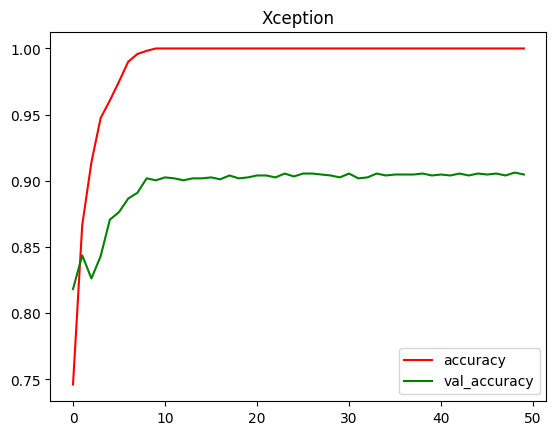

In [75]:
plt.plot([i for i in range(len(history_2.history['accuracy']))], history_2.history['accuracy'], color='red',label=f'accuracy')
plt.plot([i for i in range(len(history_2.history['val_accuracy']))], history_2.history['val_accuracy'], color='green',label=f'val_accuracy')
plt.title("Xception")
plt.legend()
plt.show()

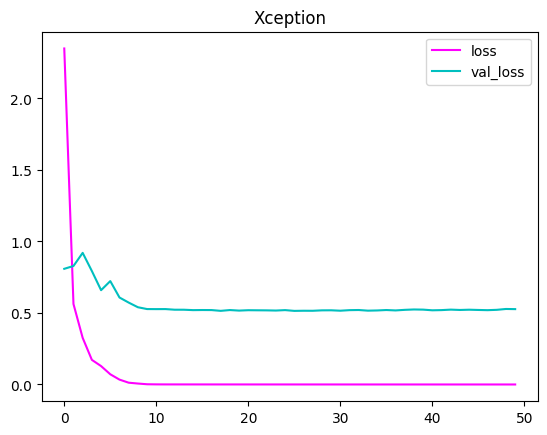

In [76]:
plt.plot([i for i in range(len(history_2.history['loss']))], history_2.history['loss'], color='magenta',label=f'loss')
plt.plot([i for i in range(len(history_2.history['val_loss']))], history_2.history['val_loss'], color='c',label=f'val_loss')
plt.title("Xception")
plt.legend()
plt.show()

1/1 [==============================] - 0s 39ms/step


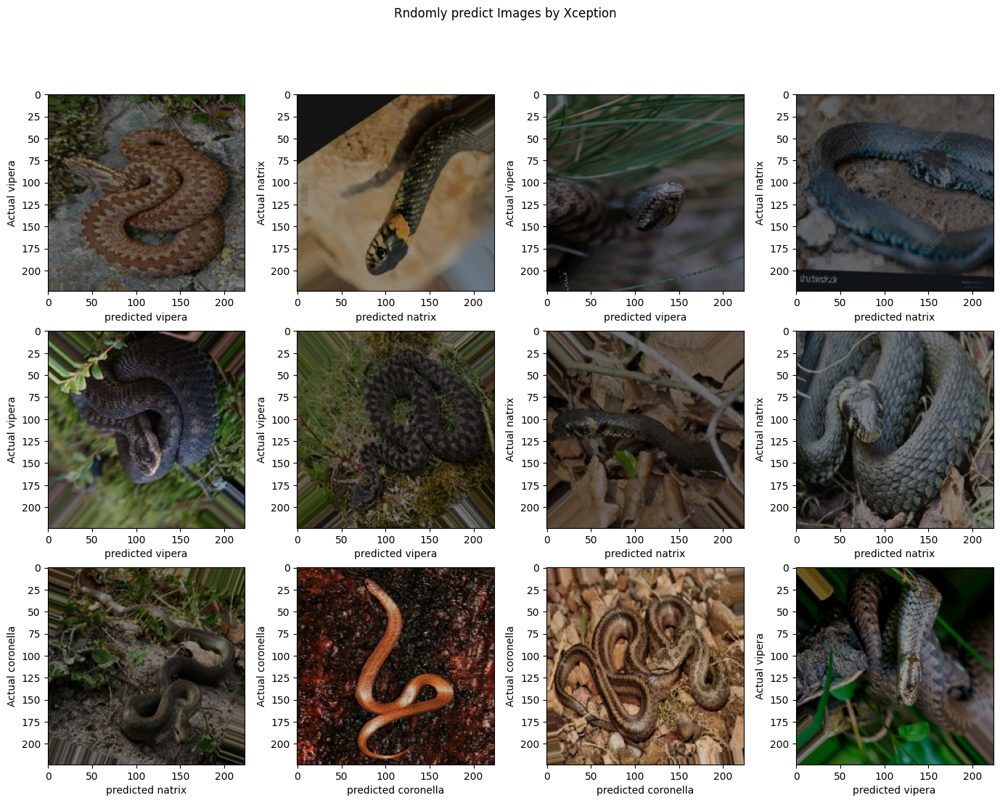

In [77]:
plt.figure(figsize=(17,12))

for i,random_number in enumerate(random.sample(range(0, 600), 12)):
    plt.subplot(3,4,i+1)
    plt.imshow(x_test[random_number])

    normalized_image = np.expand_dims(x_test[random_number], axis=0)
    predictions = model_2.predict(normalized_image)

    plt.ylabel(f'Actual {name_of_label[y_test[random_number]].split("_")[0]}')
    plt.xlabel(f'predicted {name_of_label[np.argmax(predictions)].split("_")[0]}')

plt.suptitle("Rndomly predict Images by Xception")
plt.show()

In [78]:
y_pre_2 = []
for i in model_2.predict(x_test):
    y_pre_2.append(np.argmax(i))
y_pre_2 = np.array(y_pre_2)

43/43 [==============================] - 6s 135ms/step


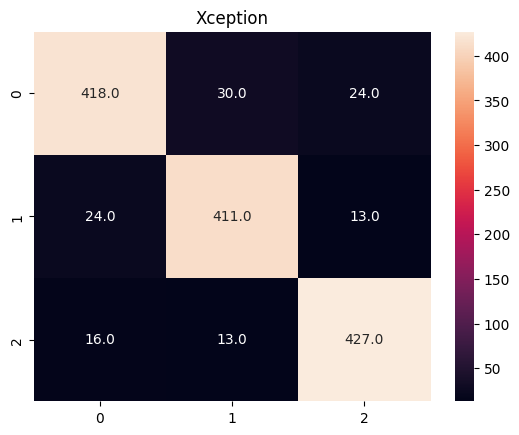

In [79]:
sns.heatmap(confusion_matrix(y_test, y_pre_2),annot=True,fmt=".1f")
plt.title("Xception")
plt.show()

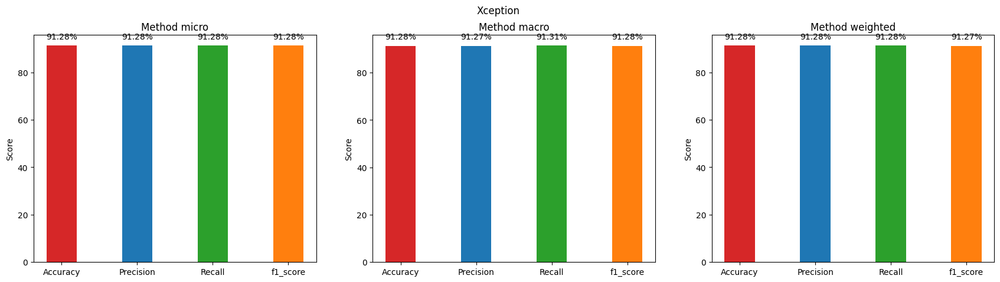

In [80]:
type_ = ['micro','macro','weighted']
plt.figure(figsize=(21,5))
for i in range(3):
    plt.subplot(1,3,i+1)
    data = {"Accuracy": accuracy_score(y_test, y_pre_2)*100,
        'Precision': precision_score(y_test, y_pre_2, average=type_[i])*100,
            'Recall':recall_score(y_test, y_pre_2, average=type_[i])*100,
            "f1_score": f1_score(y_test, y_pre_2, average=type_[i])*100}
    courses = list(data.keys())
    values = list(data.values())
    bar_colors = ['tab:red', 'tab:blue', 'tab:green', 'tab:orange']
    plt.bar(courses, values, color=bar_colors,
            width = 0.4)
    for j, v in enumerate(values):
        plt.text(j, v + 2, f'{round(v, 2)}%', ha='center', va='bottom')

    plt.ylabel("Score")
    plt.title(f"Method {type_[i]}")
plt.suptitle("Xception")
plt.show()

 **Model 3**

In [81]:
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model.trainable = False

# Create an input layer with image normalization
input_layer = layers.Input(shape=(224, 224, 3))
normalized_input = layers.Rescaling(1./255)(input_layer)  # Normalize pixel values between 0 and 1

# Connect the input layer to the base model
x = base_model(normalized_input)

# Add a new output layer
x = layers.Flatten()(x)
output = layers.Dense(3, activation='softmax')(x)

# Create the new model
model_3 = Model(input_layer, output)

# Compile the model
model_3.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [82]:
model_3.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 rescaling_4 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_4 (Flatten)         (None, 25088)             0         
                                                                 
 dense_6 (Dense)             (None, 3)                 75267     
                                                                 
Total params: 14789955 (56.42 MB)
Trainable params: 75267 (294.01 KB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


In [83]:
#history_3 = model_3.fit(x_train, to_categorical(y_train), epochs=50, batch_size=64, validation_data=(x_test, to_categorical(y_test)))

In [84]:
# model_3.save('/content/drive/MyDrive/SHUVO SIR SNAKES/VGG16.h5')
# joblib.dump(history_3, '/content/drive/MyDrive/SHUVO SIR SNAKES/VGG16_history.pkl')

In [85]:
model_3 = tf.keras.models.load_model('/content/drive/MyDrive/SHUVO SIR SNAKES/VGG16.h5')
history_3 = joblib.load('/content/drive/MyDrive/SHUVO SIR SNAKES/VGG16_history.pkl')

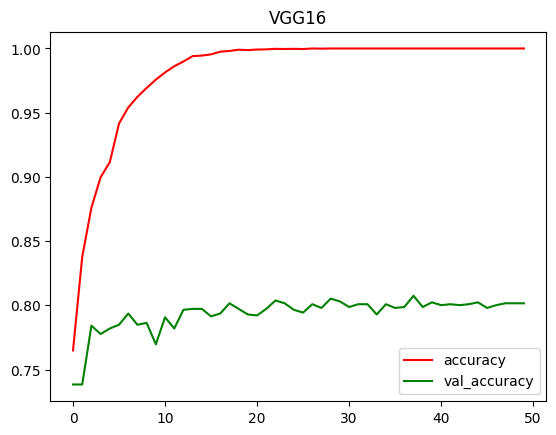

In [86]:
plt.plot([i for i in range(len(history_3.history['accuracy']))], history_3.history['accuracy'], color='red',label=f'accuracy')
plt.plot([i for i in range(len(history_3.history['val_accuracy']))], history_3.history['val_accuracy'], color='green',label=f'val_accuracy')
plt.legend()
plt.title("VGG16")
plt.show()

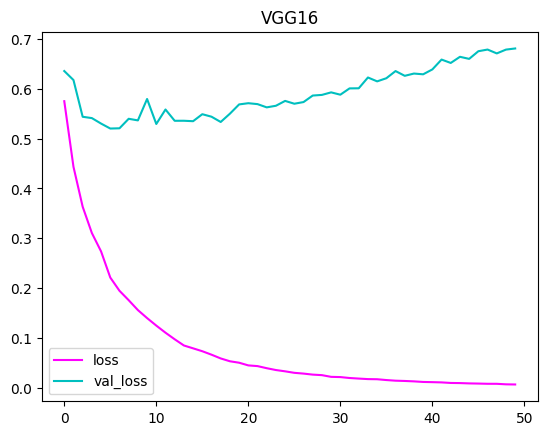

In [87]:
plt.plot([i for i in range(len(history_3.history['loss']))], history_3.history['loss'], color='magenta',label=f'loss')
plt.plot([i for i in range(len(history_3.history['val_loss']))], history_3.history['val_loss'], color='c',label=f'val_loss')
plt.title("VGG16")
plt.legend()
plt.show()

1/1 [==============================] - 0s 20ms/step


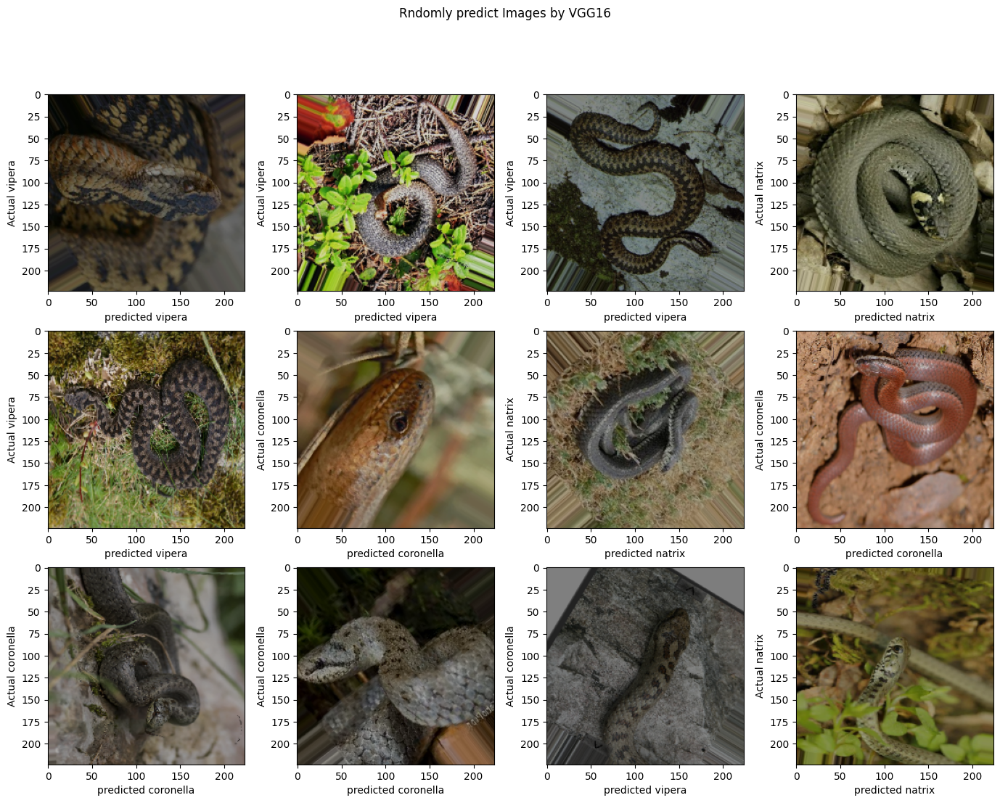

In [88]:
plt.figure(figsize=(17,12))

for i,random_number in enumerate(random.sample(range(0, 600), 12)):
    plt.subplot(3,4,i+1)
    plt.imshow(x_test[random_number])

    normalized_image = np.expand_dims(x_test[random_number], axis=0)
    predictions = model_3.predict(normalized_image)

    plt.ylabel(f'Actual {name_of_label[y_test[random_number]].split("_")[0]}')
    plt.xlabel(f'predicted {name_of_label[np.argmax(predictions)].split("_")[0]}')

plt.suptitle("Rndomly predict Images by VGG16")
plt.show()

In [89]:
y_pre_3 = []
for i in model_3.predict(x_test):
    y_pre_3.append(np.argmax(i))
y_pre_3 = np.array(y_pre_3)

43/43 [==============================] - 5s 120ms/step


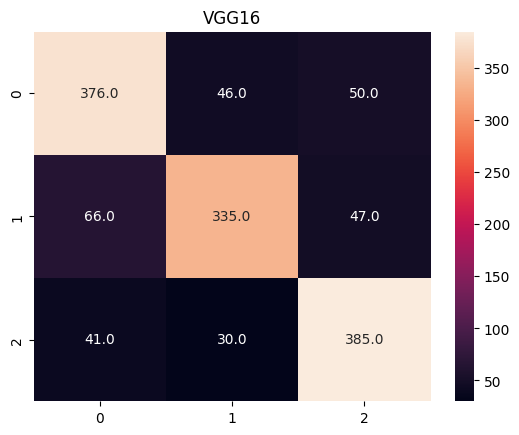

In [90]:
sns.heatmap(confusion_matrix(y_test, y_pre_3),annot=True,fmt=".1f")
plt.title("VGG16")
plt.show()

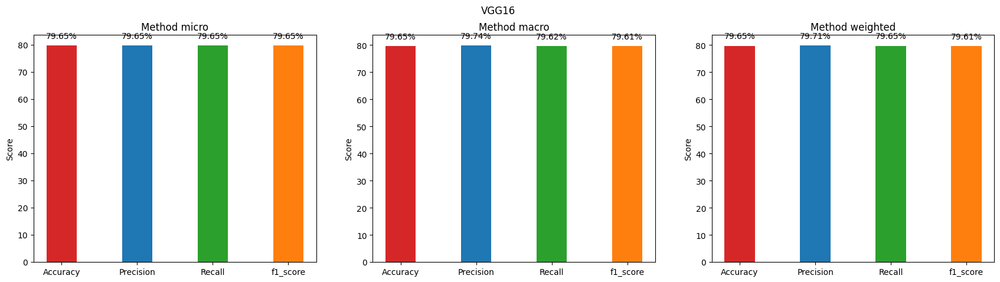

In [91]:
type_ = ['micro','macro','weighted']
plt.figure(figsize=(21,5))
for i in range(3):
    plt.subplot(1,3,i+1)
    data = {"Accuracy": accuracy_score(y_test, y_pre_3)*100,
        'Precision': precision_score(y_test, y_pre_3, average=type_[i])*100,
            'Recall':recall_score(y_test, y_pre_3, average=type_[i])*100,
            "f1_score": f1_score(y_test, y_pre_3, average=type_[i])*100}
    courses = list(data.keys())
    values = list(data.values())
    bar_colors = ['tab:red', 'tab:blue', 'tab:green', 'tab:orange']
    plt.bar(courses, values, color=bar_colors,
            width = 0.4)
    for j, v in enumerate(values):
        plt.text(j, v + 2, f'{round(v, 2)}%', ha='center', va='bottom')

    plt.ylabel("Score")
    plt.title(f"Method {type_[i]}")
plt.suptitle("VGG16")
plt.show()

**Model 4**

In [93]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model.trainable = False

# Create an input layer with image normalization
input_layer = layers.Input(shape=(224, 224, 3))
normalized_input = layers.Rescaling(1./255)(input_layer)  # Normalize pixel values between 0 and 1

# Connect the input layer to the base model
x = base_model(normalized_input)

# Add a new output layer
x = layers.Flatten()(x)
output = layers.Dense(3, activation='softmax')(x)

# Create the new model
model_4 = Model(input_layer, output)

# Compile the model
model_4.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

94765736/94765736 [==============================] - 1s 0us/step


In [97]:
model_4.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 rescaling_5 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 flatten_5 (Flatten)         (None, 100352)            0         
                                                                 
 dense_7 (Dense)             (None, 3)                 301059    
                                                                 
Total params: 23888771 (91.13 MB)
Trainable params: 301059 (1.15 MB)
Non-trainable params: 23587712 (89.98 MB)
_________________________________________________________________


In [95]:
#history_4 = model_4.fit(x_train, to_categorical(y_train), epochs=50, batch_size=64, validation_data=(x_test, to_categorical(y_test)))

Epoch 1/50
113/113 [==============================] - 41s 305ms/step - loss: 2.1203 - accuracy: 0.3725 - val_loss: 1.0563 - val_accuracy: 0.4251
Epoch 2/50
113/113 [==============================] - 26s 228ms/step - loss: 1.1621 - accuracy: 0.4169 - val_loss: 1.5761 - val_accuracy: 0.3968
Epoch 3/50
113/113 [==============================] - 26s 228ms/step - loss: 1.0997 - accuracy: 0.4535 - val_loss: 1.3268 - val_accuracy: 0.3430
Epoch 4/50
113/113 [==============================] - 25s 224ms/step - loss: 1.1291 - accuracy: 0.4784 - val_loss: 1.1360 - val_accuracy: 0.4164
Epoch 5/50
113/113 [==============================] - 24s 212ms/step - loss: 1.0235 - accuracy: 0.4922 - val_loss: 1.0969 - val_accuracy: 0.4753
Epoch 6/50
113/113 [==============================] - 24s 214ms/step - loss: 1.2010 - accuracy: 0.4549 - val_loss: 1.0291 - val_accuracy: 0.4782
Epoch 7/50
113/113 [==============================] - 26s 226ms/step - loss: 1.0744 - accuracy: 0.4907 - val_loss: 1.0985 - val_ac

In [98]:
# model_4.save('/content/drive/MyDrive/SHUVO SIR SNAKES/ResNet50.h5')
# joblib.dump(history_4, '/content/drive/MyDrive/SHUVO SIR SNAKES/ResNet50_history.pkl')

['/content/drive/MyDrive/SHUVO SIR SNAKES/ResNet50_history.pkl']

In [99]:
model_4 = tf.keras.models.load_model('/content/drive/MyDrive/SHUVO SIR SNAKES/ResNet50.h5')
history_4 = joblib.load('/content/drive/MyDrive/SHUVO SIR SNAKES/ResNet50_history.pkl')

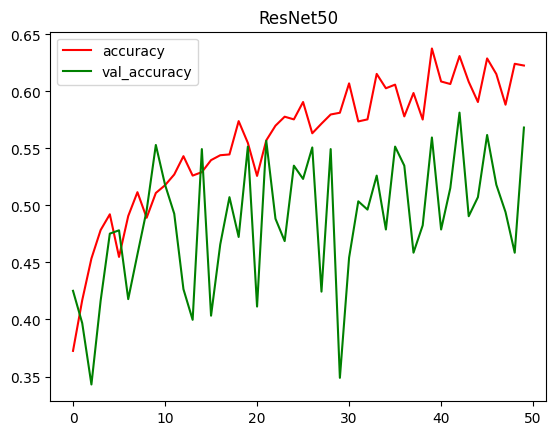

In [101]:
plt.plot([i for i in range(len(history_3.history['accuracy']))], history_4.history['accuracy'], color='red',label=f'accuracy')
plt.plot([i for i in range(len(history_3.history['val_accuracy']))], history_4.history['val_accuracy'], color='green',label=f'val_accuracy')
plt.legend()
plt.title("ResNet50")
plt.show()

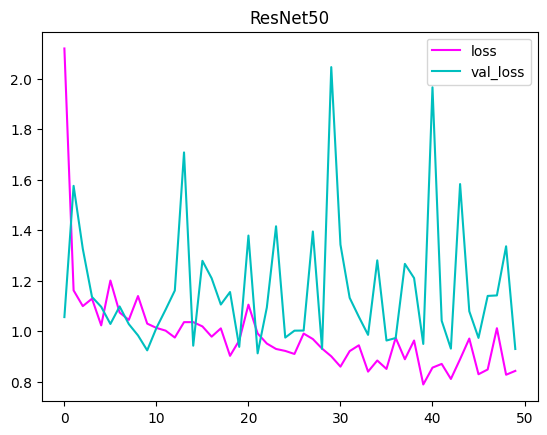

In [102]:
plt.plot([i for i in range(len(history_3.history['loss']))], history_4.history['loss'], color='magenta',label=f'loss')
plt.plot([i for i in range(len(history_3.history['val_loss']))], history_4.history['val_loss'], color='c',label=f'val_loss')
plt.title("ResNet50")
plt.legend()
plt.show()

1/1 [==============================] - 0s 45ms/step


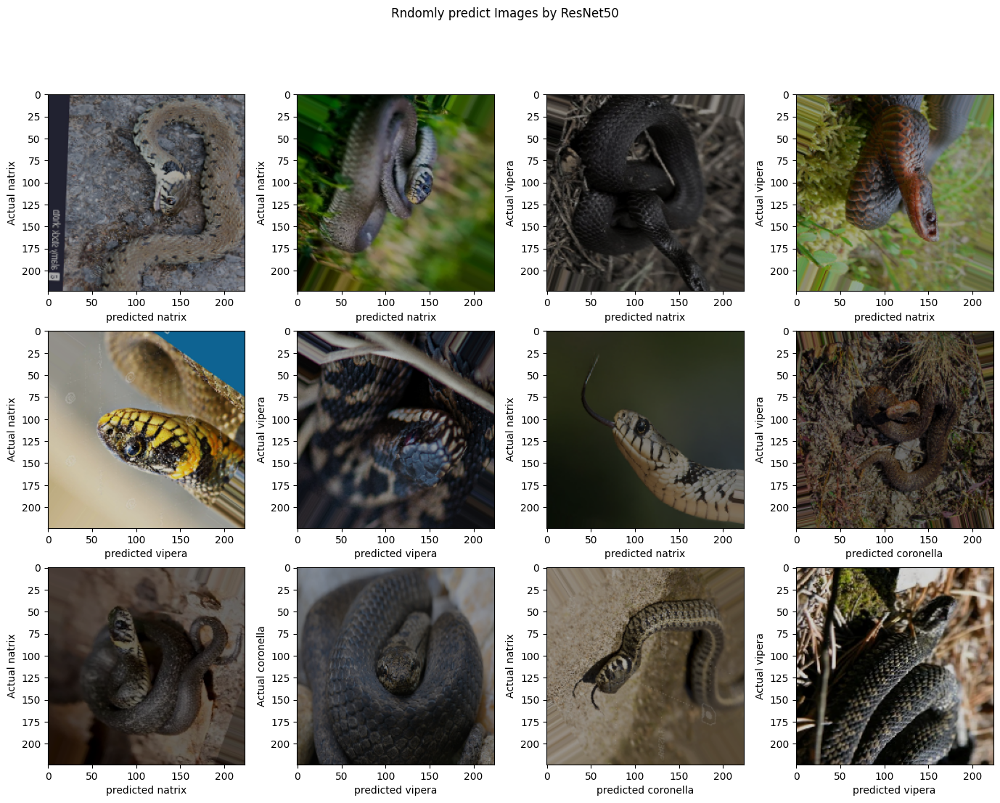

In [104]:
plt.figure(figsize=(17,12))

for i,random_number in enumerate(random.sample(range(0, 600), 12)):
    plt.subplot(3,4,i+1)
    plt.imshow(x_test[random_number])

    normalized_image = np.expand_dims(x_test[random_number], axis=0)
    predictions = model_4.predict(normalized_image)

    plt.ylabel(f'Actual {name_of_label[y_test[random_number]].split("_")[0]}')
    plt.xlabel(f'predicted {name_of_label[np.argmax(predictions)].split("_")[0]}')

plt.suptitle("Rndomly predict Images by ResNet50")
plt.show()

In [105]:
y_pre_4 = []
for i in model_4.predict(x_test):
    y_pre_4.append(np.argmax(i))
y_pre_4 = np.array(y_pre_4)

43/43 [==============================] - 4s 89ms/step


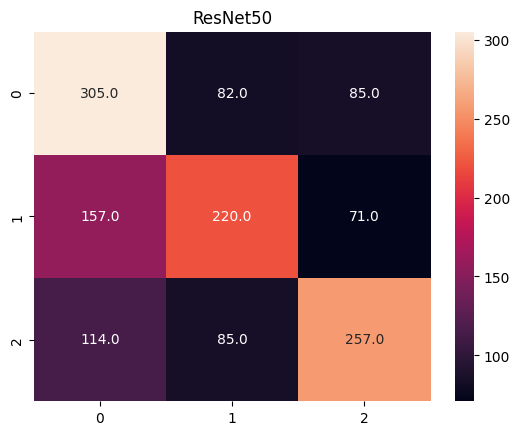

In [107]:
sns.heatmap(confusion_matrix(y_test, y_pre_4),annot=True,fmt=".1f")
plt.title("ResNet50")
plt.show()

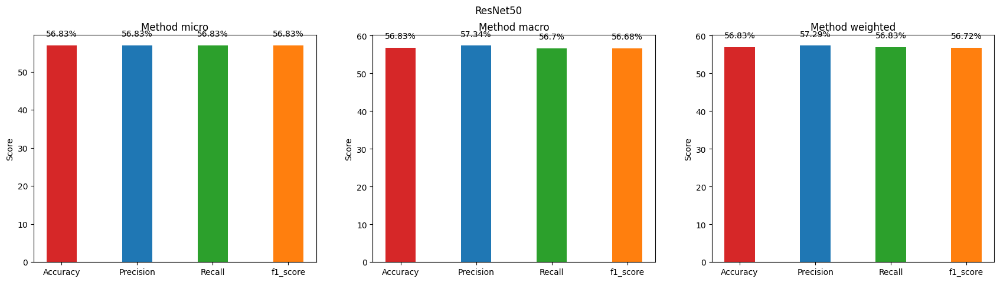

In [108]:
type_ = ['micro','macro','weighted']
plt.figure(figsize=(21,5))
for i in range(3):
    plt.subplot(1,3,i+1)
    data = {"Accuracy": accuracy_score(y_test, y_pre_4)*100,
        'Precision': precision_score(y_test, y_pre_4, average=type_[i])*100,
            'Recall':recall_score(y_test, y_pre_4, average=type_[i])*100,
            "f1_score": f1_score(y_test, y_pre_4, average=type_[i])*100}
    courses = list(data.keys())
    values = list(data.values())
    bar_colors = ['tab:red', 'tab:blue', 'tab:green', 'tab:orange']
    plt.bar(courses, values, color=bar_colors,
            width = 0.4)
    for j, v in enumerate(values):
        plt.text(j, v + 2, f'{round(v, 2)}%', ha='center', va='bottom')

    plt.ylabel("Score")
    plt.title(f"Method {type_[i]}")
plt.suptitle("ResNet50")
plt.show()

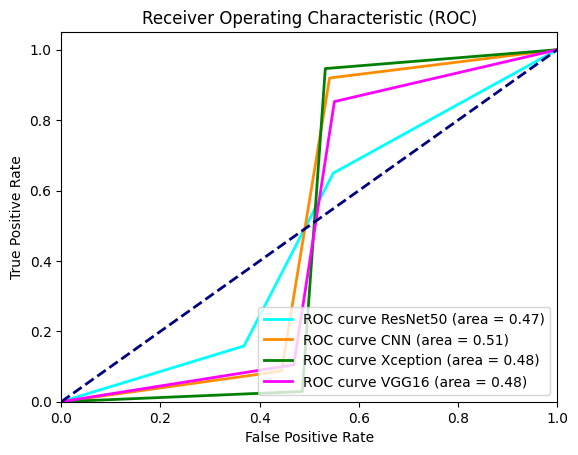

<Figure size 640x480 with 0 Axes>

In [114]:
# Calculate ROC and AUC for each model
fpr_1, tpr_1, thresholds_1 = roc_curve(y_test, y_pre_0, pos_label=1)
roc_auc_1 = auc(fpr_1, tpr_1)

fpr_2, tpr_2, thresholds_2 = roc_curve(y_test, y_pre_2, pos_label=1)
roc_auc_2 = auc(fpr_2, tpr_2)

fpr_3, tpr_3, thresholds_3 = roc_curve(y_test, y_pre_3, pos_label=1)
roc_auc_3 = auc(fpr_3, tpr_3)

fpr_4, tpr_4, thresholds_4 = roc_curve(y_test, y_pre_4, pos_label=1)
roc_auc_4 = auc(fpr_4, tpr_4)

# Plot ROC curve
plt.figure()
plt.plot(fpr_4, tpr_4, color='cyan', lw=2, label=f'ROC curve ResNet50 (area = {roc_auc_4:.2f})')
plt.plot(fpr_1, tpr_1, color='darkorange', lw=2, label=f'ROC curve CNN (area = {roc_auc_1:.2f})')
plt.plot(fpr_2, tpr_2, color='green', lw=2, label=f'ROC curve Xception (area = {roc_auc_2:.2f})')
plt.plot(fpr_3, tpr_3, color='magenta', lw=2, label=f'ROC curve VGG16 (area = {roc_auc_3:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()